## Setup and Load Data

1.1 Install Dependencies and Setup

In [1]:
!pip install tensorflow keras numpy opencv-python matplotlib

In [2]:
!pip list

Package                      Version
---------------------------- -----------
absl-py                      2.1.0
asttokens                    2.4.1
astunparse                   1.6.3
certifi                      2024.2.2
charset-normalizer           3.3.2
comm                         0.2.2
contourpy                    1.2.1
cycler                       0.12.1
debugpy                      1.8.1
decorator                    5.1.1
exceptiongroup               1.2.1
executing                    2.0.1
flatbuffers                  24.3.25
fonttools                    4.51.0
gast                         0.5.4
google-pasta                 0.2.0
grpcio                       1.63.0
h5py                         3.11.0
idna                         3.7
importlib_metadata           7.1.0
importlib_resources          6.4.0
ipykernel                    6.29.4
ipython                      8.18.1
jedi                         0.19.1
jupyter_client               8.6.1
jupyter_core                 5.7.2
ke

In [3]:
import tensorflow as tf
import os

KeyboardInterrupt: 

In [ ]:
import cv2
import imghdr

In [ ]:
data_dir = 'data' 
image_extensions = ['jpg', 'jpeg', 'png', "png", "tiff"]  

In [ ]:
# for image_class in os.listdir(data_dir):
#     for image in os.listdir(os.path.join(data_dir, image_class)):
#         image_path = os.path.join(data_dir, image_class, image)
#         try:
#             img = cv2.imread(image_path)
#             tip = imghdr.what(image_path)
#             if tip not in image_extensions:
#                 print(f"Invalid image type: {image_path}")
#                 os.remove(image_path)
#         except Exception as e:
#             print(f"Error reading image: {image_path}")
#             os.remove(image_path)

In [ ]:
# # Transform every image to png
# for image_class in os.listdir(data_dir):
#     for image in os.listdir(os.path.join(data_dir, image_class)):
#         image_path = os.path.join(data_dir, image_class, image)
#         if image_path.endswith('.png'):
#             continue           

#         try:
#             img = cv2.imread(image_path)
#             image_path_png = image_path.replace(".tiff", ".png")
#             cv2.imwrite(image_path_png, img, [int(cv2.IMWRITE_PNG_COMPRESSION), 9])
#             os.remove(image_path)
#         except Exception as e:
#             print(f"Error transforming image: {image_path}")
#             # os.remove(image_path)

In [ ]:
tf.data.Dataset.list_files

<function tensorflow.python.data.ops.dataset_ops.DatasetV2.list_files(file_pattern, shuffle=None, seed=None, name=None) -> 'DatasetV2'>

In [ ]:
import numpy as np


In [ ]:
data = tf.keras.utils.image_dataset_from_directory('data')

Found 19748 files belonging to 3 classes.


In [ ]:
data.class_names

['assinaturas', 'averbacao', 'lig']

In [ ]:
data_iter = data.as_numpy_iterator()
data_iter

NumpyIterator(iterator=<tensorflow.python.data.ops.iterator_ops.OwnedIterator object at 0x7fda6417cdc0>)

In [ ]:
bacth = data_iter.next()
bacth

(array([[[[254.     , 254.     , 254.     ],
          [254.     , 254.     , 254.     ],
          [254.     , 254.     , 254.     ],
          ...,
          [254.     , 254.     , 254.     ],
          [254.     , 254.     , 254.     ],
          [254.     , 254.     , 254.     ]],
 
         [[254.     , 254.     , 254.     ],
          [254.     , 254.     , 254.     ],
          [255.     , 255.     , 255.     ],
          ...,
          [255.     , 255.     , 255.     ],
          [254.49414, 254.49414, 254.49414],
          [254.     , 254.     , 254.     ]],
 
         [[254.     , 254.     , 254.     ],
          [254.     , 254.     , 254.     ],
          [186.31429, 186.31429, 186.31429],
          ...,
          [255.     , 255.     , 255.     ],
          [254.49414, 254.49414, 254.49414],
          [254.     , 254.     , 254.     ]],
 
         ...,
 
         [[250.49805, 250.49805, 250.49805],
          [255.     , 255.     , 255.     ],
          [248.50977, 248.5097

In [ ]:
len(bacth)

2

In [ ]:
bacth[0].shape  
bacth[1]


array([1, 0, 1, 2, 0, 1, 1, 2, 1, 1, 2, 2, 2, 2, 2, 1, 1, 0, 1, 2, 2, 2,
       2, 2, 2, 2, 1, 0, 0, 2, 2, 0], dtype=int32)

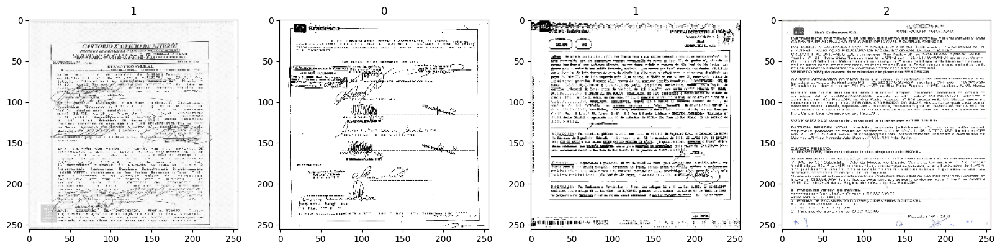

In [ ]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(ncols=4, figsize=(20, 20))
for idx, img in enumerate(bacth[0][:4]):
    ax[idx].imshow(img.astype(int))
    ax[idx].set_title(bacth[1][idx])
    

## Preprocessing Data

In [ ]:
scaled = bacth[0]/255

In [ ]:
scaled.min()

0.0

In [ ]:
data = data.map(lambda x, y: (x/255, y))

In [ ]:
scaled_iter = data.as_numpy_iterator()
bacth = scaled_iter.next()
bacth[0].max()

1.0

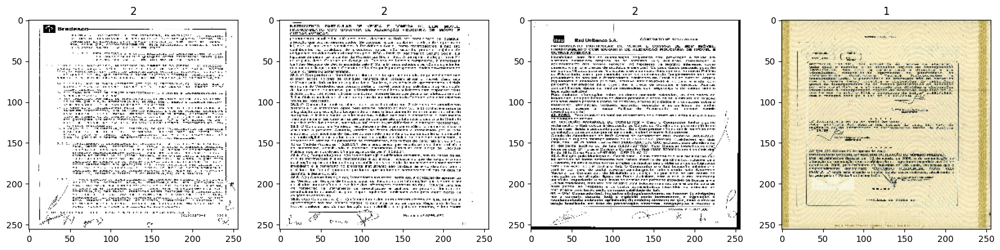

In [ ]:
fig, ax = plt.subplots(ncols=4, figsize=(20, 20))
for idx, img in enumerate(bacth[0][:4]):
    ax[idx].imshow(img)
    ax[idx].set_title(bacth[1][idx])
    

### Split Data

In [ ]:
len(data)

618

In [ ]:
train_size = 580
val_size = 20
test_size = 18

In [ ]:
print(train_size, val_size, test_size)

580 20 18


In [ ]:
train = data.take(train_size)
val = data.skip(train_size).take(val_size)
test = data.skip(train_size+val_size).take(test_size)

## Deep Learning

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

In [ ]:
model = Sequential()

In [ ]:

model.add(Conv2D(16, (3, 3), activation='relu', input_shape=(256, 256, 3)))
model.add(MaxPooling2D())

model.add(Conv2D(32, (3, 3),1, activation='relu'))
model.add(MaxPooling2D())

model.add(Conv2D(16, (3, 3),1, activation='relu'))
model.add(MaxPooling2D())


model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dense(3, activation='softmax'))  # Cambiado a 3 clases y softmax


/media/manuel/Local D/FINTOOLS/Projects/PDF2IMAGE/.venv/lib/python3.9/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model.compile(optimizer='adam', loss=tf.losses.SparseCategoricalCrossentropy(), metrics=['accuracy'])  # Loss function modificada


In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 254, 254, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 127, 127, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 125, 125, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 62, 62, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 60, 60, 16)     │         4,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 30, 30, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 14400)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │     3,686,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │           771 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,697,139 (14.10 MB)

 Trainable params: 3,697,139 (14.10 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
logdir = 'logs'

In [ ]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
hist = model.fit(train,epochs=20, validation_data=val,  callbacks=[tensorboard_callback])

Epoch 1/20


580/580 ━━━━━━━━━━━━━━━━━━━━ 0s 638ms/step - accuracy: 0.8249 - loss: 0.4539

2024-05-08 23:08:15.795364: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 25165952 bytes after encountering the first element of size 25165952 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


580/580 ━━━━━━━━━━━━━━━━━━━━ 659s 1s/step - accuracy: 0.8250 - loss: 0.4535 - val_accuracy: 0.9688 - val_loss: 0.0914
Epoch 2/20
580/580 ━━━━━━━━━━━━━━━━━━━━ 0s 624ms/step - accuracy: 0.9751 - loss: 0.0759

2024-05-08 23:18:26.797214: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 25165952 bytes after encountering the first element of size 25165952 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


580/580 ━━━━━━━━━━━━━━━━━━━━ 609s 1s/step - accuracy: 0.9751 - loss: 0.0759 - val_accuracy: 0.9719 - val_loss: 0.0690
Epoch 3/20
580/580 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9884 - loss: 0.0372

2024-05-08 23:44:13.252148: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 25165952 bytes after encountering the first element of size 25165952 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


580/580 ━━━━━━━━━━━━━━━━━━━━ 1549s 3s/step - accuracy: 0.9884 - loss: 0.0372 - val_accuracy: 0.9672 - val_loss: 0.1015
Epoch 4/20
580/580 ━━━━━━━━━━━━━━━━━━━━ 0s 713ms/step - accuracy: 0.9925 - loss: 0.0243

2024-05-08 23:56:15.127011: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 25165952 bytes after encountering the first element of size 25165952 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


580/580 ━━━━━━━━━━━━━━━━━━━━ 721s 1s/step - accuracy: 0.9925 - loss: 0.0243 - val_accuracy: 0.9797 - val_loss: 0.1004
Epoch 5/20
580/580 ━━━━━━━━━━━━━━━━━━━━ 0s 910ms/step - accuracy: 0.9959 - loss: 0.0136

2024-05-09 00:11:00.884483: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 25165952 bytes after encountering the first element of size 25165952 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


580/580 ━━━━━━━━━━━━━━━━━━━━ 889s 2s/step - accuracy: 0.9959 - loss: 0.0136 - val_accuracy: 0.9891 - val_loss: 0.0394
Epoch 6/20
580/580 ━━━━━━━━━━━━━━━━━━━━ 0s 696ms/step - accuracy: 0.9956 - loss: 0.0142

2024-05-09 00:21:54.407107: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 25165952 bytes after encountering the first element of size 25165952 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


580/580 ━━━━━━━━━━━━━━━━━━━━ 649s 1s/step - accuracy: 0.9956 - loss: 0.0142 - val_accuracy: 0.9469 - val_loss: 0.1697
Epoch 7/20
580/580 ━━━━━━━━━━━━━━━━━━━━ 0s 588ms/step - accuracy: 0.9956 - loss: 0.0146

2024-05-09 00:32:08.800688: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 25165952 bytes after encountering the first element of size 25165952 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


580/580 ━━━━━━━━━━━━━━━━━━━━ 615s 1s/step - accuracy: 0.9956 - loss: 0.0146 - val_accuracy: 0.9875 - val_loss: 0.0499
Epoch 8/20
580/580 ━━━━━━━━━━━━━━━━━━━━ 0s 597ms/step - accuracy: 0.9982 - loss: 0.0071

2024-05-09 00:43:12.244300: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 25165952 bytes after encountering the first element of size 25165952 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


580/580 ━━━━━━━━━━━━━━━━━━━━ 664s 1s/step - accuracy: 0.9982 - loss: 0.0071 - val_accuracy: 0.9844 - val_loss: 0.0526
Epoch 9/20
580/580 ━━━━━━━━━━━━━━━━━━━━ 0s 595ms/step - accuracy: 0.9970 - loss: 0.0105

2024-05-09 00:53:06.279041: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 25165952 bytes after encountering the first element of size 25165952 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


580/580 ━━━━━━━━━━━━━━━━━━━━ 592s 1s/step - accuracy: 0.9970 - loss: 0.0105 - val_accuracy: 0.9875 - val_loss: 0.0399
Epoch 10/20
580/580 ━━━━━━━━━━━━━━━━━━━━ 0s 561ms/step - accuracy: 0.9973 - loss: 0.0113

2024-05-09 01:02:32.965311: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 25165952 bytes after encountering the first element of size 25165952 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


580/580 ━━━━━━━━━━━━━━━━━━━━ 566s 975ms/step - accuracy: 0.9973 - loss: 0.0113 - val_accuracy: 0.9953 - val_loss: 0.0434
Epoch 11/20
580/580 ━━━━━━━━━━━━━━━━━━━━ 0s 564ms/step - accuracy: 0.9982 - loss: 0.0076

2024-05-09 01:12:25.071773: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 25165952 bytes after encountering the first element of size 25165952 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


580/580 ━━━━━━━━━━━━━━━━━━━━ 593s 1s/step - accuracy: 0.9982 - loss: 0.0076 - val_accuracy: 0.9844 - val_loss: 0.0617
Epoch 12/20
580/580 ━━━━━━━━━━━━━━━━━━━━ 0s 611ms/step - accuracy: 0.9964 - loss: 0.0109

2024-05-09 01:22:23.103818: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 25165952 bytes after encountering the first element of size 25165952 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


580/580 ━━━━━━━━━━━━━━━━━━━━ 602s 1s/step - accuracy: 0.9964 - loss: 0.0109 - val_accuracy: 0.9922 - val_loss: 0.0397
Epoch 13/20
580/580 ━━━━━━━━━━━━━━━━━━━━ 0s 548ms/step - accuracy: 0.9990 - loss: 0.0039

2024-05-09 01:31:23.991375: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 25165952 bytes after encountering the first element of size 25165952 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


580/580 ━━━━━━━━━━━━━━━━━━━━ 536s 924ms/step - accuracy: 0.9990 - loss: 0.0039 - val_accuracy: 0.9875 - val_loss: 0.0487
Epoch 14/20
580/580 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step - accuracy: 0.9996 - loss: 0.0027

2024-05-09 01:41:07.915826: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 25165952 bytes after encountering the first element of size 25165952 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


580/580 ━━━━━━━━━━━━━━━━━━━━ 587s 1s/step - accuracy: 0.9996 - loss: 0.0027 - val_accuracy: 0.9875 - val_loss: 0.0500
Epoch 15/20
580/580 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step - accuracy: 0.9994 - loss: 0.0019

2024-05-09 01:51:30.271381: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 25165952 bytes after encountering the first element of size 25165952 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


580/580 ━━━━━━━━━━━━━━━━━━━━ 624s 1s/step - accuracy: 0.9994 - loss: 0.0019 - val_accuracy: 0.9859 - val_loss: 0.0606
Epoch 16/20
580/580 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step - accuracy: 0.9995 - loss: 0.0021

2024-05-09 01:59:53.630819: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 25165952 bytes after encountering the first element of size 25165952 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


580/580 ━━━━━━━━━━━━━━━━━━━━ 499s 860ms/step - accuracy: 0.9995 - loss: 0.0021 - val_accuracy: 0.9859 - val_loss: 0.0585
Epoch 17/20
580/580 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step - accuracy: 0.9986 - loss: 0.0061

2024-05-09 02:08:23.904096: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 25165952 bytes after encountering the first element of size 25165952 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


580/580 ━━━━━━━━━━━━━━━━━━━━ 515s 888ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.9812 - val_loss: 0.1406
Epoch 18/20
580/580 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step - accuracy: 0.9987 - loss: 0.0056

2024-05-09 02:16:54.478291: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 25165952 bytes after encountering the first element of size 25165952 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


580/580 ━━━━━━━━━━━━━━━━━━━━ 506s 872ms/step - accuracy: 0.9987 - loss: 0.0056 - val_accuracy: 0.9875 - val_loss: 0.0511
Epoch 19/20
580/580 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step - accuracy: 0.9991 - loss: 0.0035

2024-05-09 02:25:18.625392: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 25165952 bytes after encountering the first element of size 25165952 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


580/580 ━━━━━━━━━━━━━━━━━━━━ 507s 875ms/step - accuracy: 0.9991 - loss: 0.0035 - val_accuracy: 0.9891 - val_loss: 0.0402
Epoch 20/20
580/580 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step - accuracy: 0.9995 - loss: 0.0012

2024-05-09 02:33:54.016265: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 25165952 bytes after encountering the first element of size 25165952 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


580/580 ━━━━━━━━━━━━━━━━━━━━ 513s 881ms/step - accuracy: 0.9995 - loss: 0.0012 - val_accuracy: 0.9922 - val_loss: 0.0400


In [ ]:
hist.history
model.save('models/model_full_data_v7.h5')

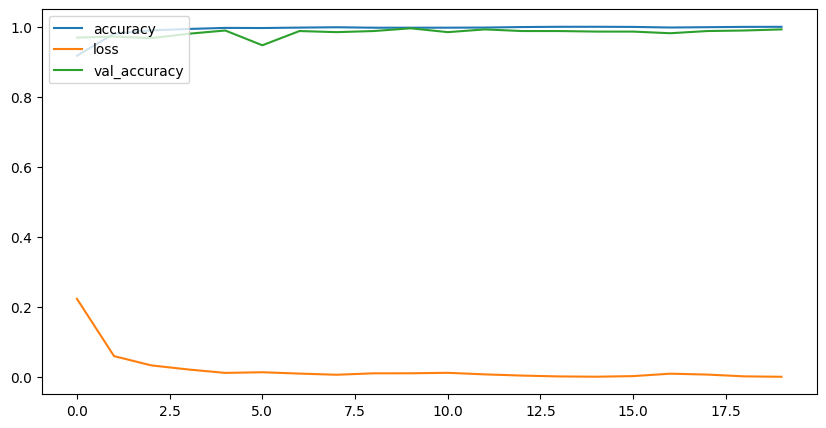

In [ ]:
fig = plt.figure(figsize=(10, 5))
plt.plot(hist.history['accuracy'], label='accuracy')
plt.plot(hist.history['loss'], label='loss')
plt.plot(hist.history['val_accuracy'], label='val_accuracy')
plt.legend(loc = 'upper left')
plt.show()

## Evualuate Performance

In [ ]:
from tensorflow.keras.metrics import Precision, Recall, AUC, SparseCategoricalAccuracy

In [ ]:
pres = Precision()
rec = Recall()
auc = AUC()
sca = SparseCategoricalAccuracy()


In [ ]:
len(test)

18

In [ ]:
for batch in test.as_numpy_iterator():
    x, y = batch
    y_pred = model.predict(x)
    
    # Ajusta la forma de y para que coincida con la forma de y_pred
    y_pred = np.argmax(y_pred, axis=1)
        
    pres.update_state(y, y_pred)
    rec.update_state(y, y_pred)
    auc.update_state(y, y_pred)

print(f"Precision: {pres.result().numpy()}")
print(f"Recall: {rec.result().numpy()}")
print(f"AUC: {auc.result().numpy()}")


2024-05-09 02:37:42.643768: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 25165952 bytes after encountering the first element of size 25165952 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
Precision: 0.9952038526535034
Recall: 1.0
AUC: 0.9924811720848083


2024-05-09 02:37:48.527105: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [ ]:
# Transform every image to png
data_dir = 'unSeentest'
for image_class in os.listdir(data_dir):
    for image in os.listdir(os.path.join(data_dir, image_class)):
        image_path = os.path.join(data_dir, image_class, image)
        if image_path.endswith(".png"):continue
        try:
            img = cv2.imread(image_path)
            image_path_png = image_path.replace(".tiff", ".png")
            cv2.imwrite(image_path_png, img, [int(cv2.IMWRITE_PNG_COMPRESSION), 9])
            os.remove(image_path)
        except Exception as e:
            print(f"Error transforming image: {image_path}")
            # os.remove(image_path)

In [ ]:
import cv2, os

In [ ]:
images = os.listdir(os.path.join(data_dir, 'teste'))


In [ ]:
img = cv2.imread(os.path.join(data_dir, 'teste', images[10]))

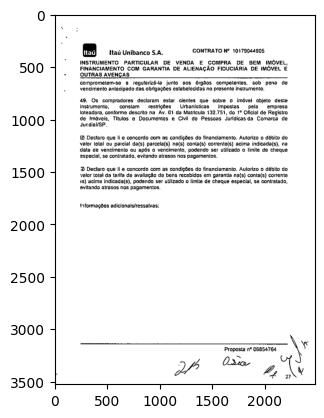

In [ ]:
plt.imshow(img)
plt.show()

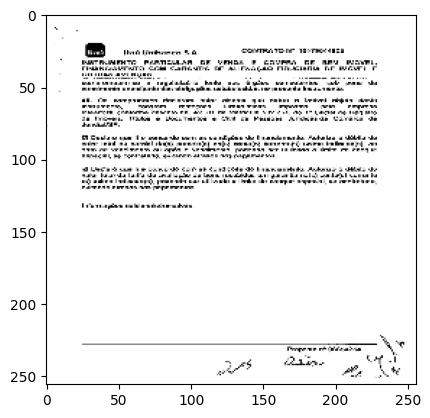

In [ ]:
resized =  tf.image.resize(img, [256, 256])
plt.imshow(resized.numpy().astype(int))
plt.show()

In [ ]:
y_pred = model.predict(np.expand_dims(resized/255,0))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


In [ ]:
y_pred.argmax()

2

In [ ]:
data = tf.keras.utils.image_dataset_from_directory('data')
data.class_names

Found 19748 files belonging to 3 classes.


['assinaturas', 'averbacao', 'lig']

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
lig


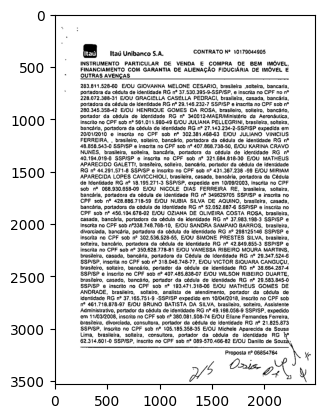

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
lig


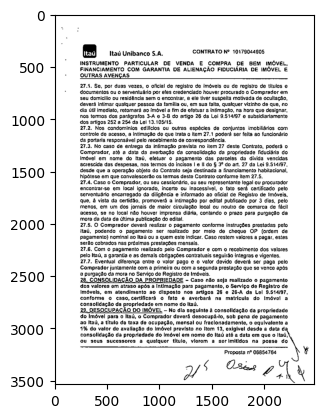

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
averbacao


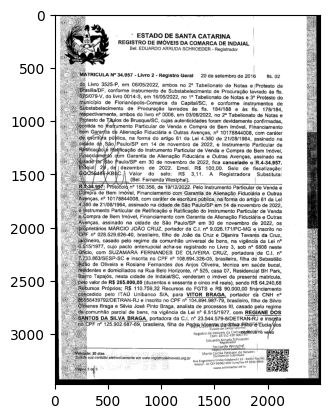

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
lig


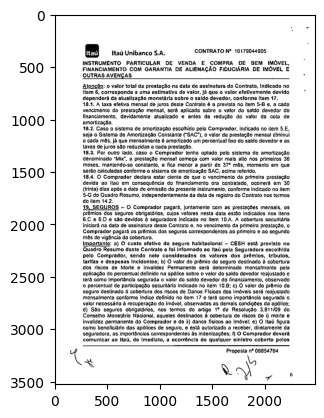

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
lig


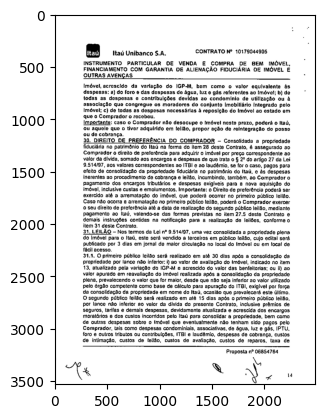

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
lig


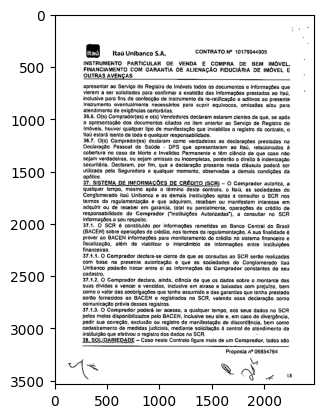

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
assinaturas


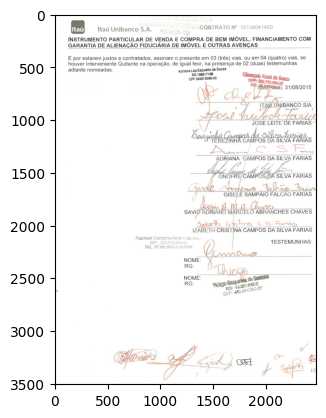

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
lig


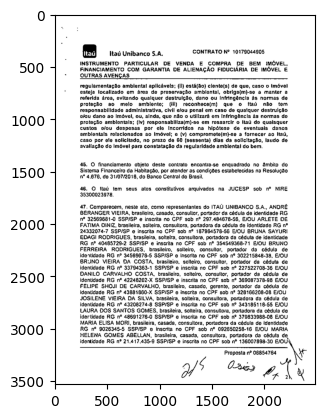

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
assinaturas


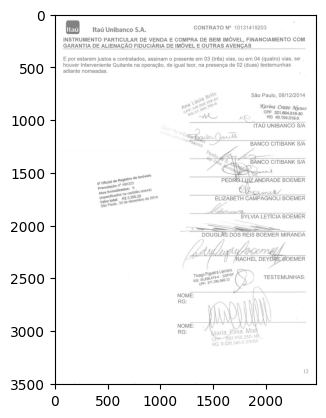

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
averbacao


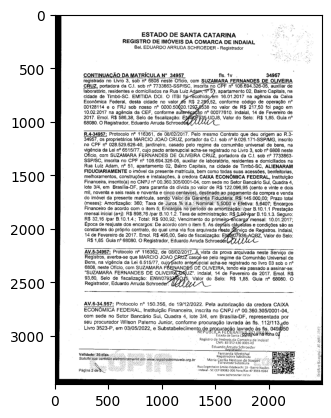

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
lig


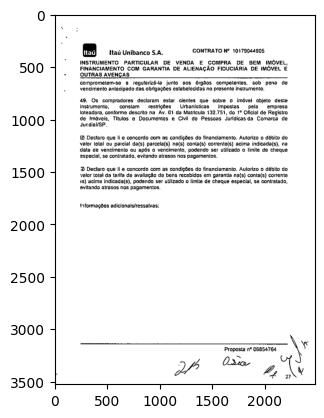

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
lig


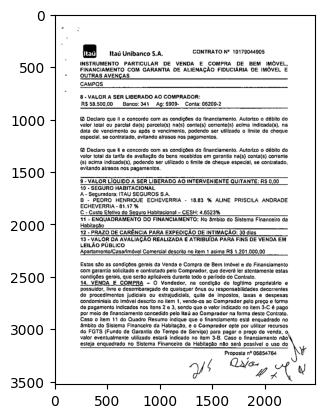

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
assinaturas


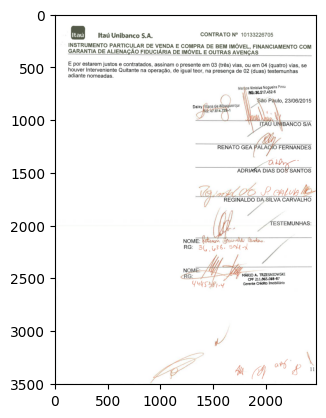

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
lig


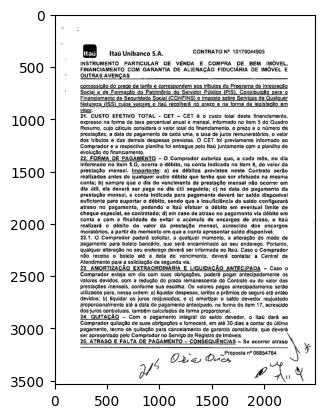

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
assinaturas


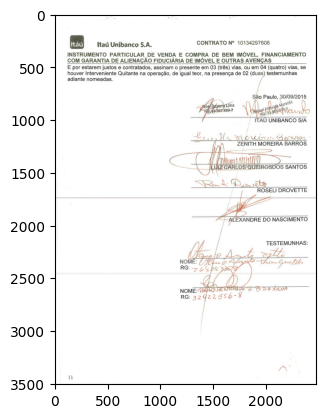

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
averbacao


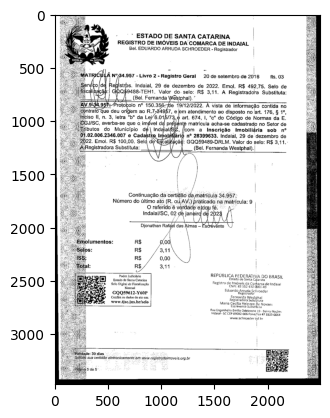

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
assinaturas


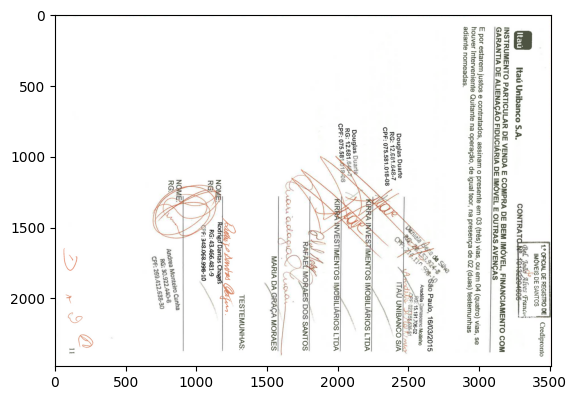

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
lig


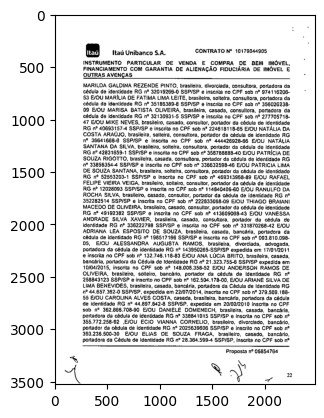

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
assinaturas


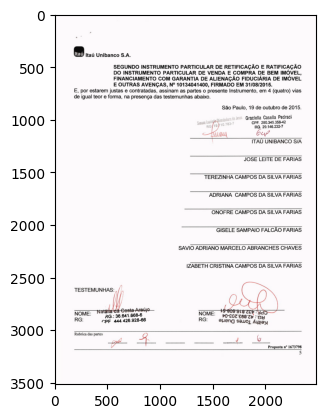

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
lig


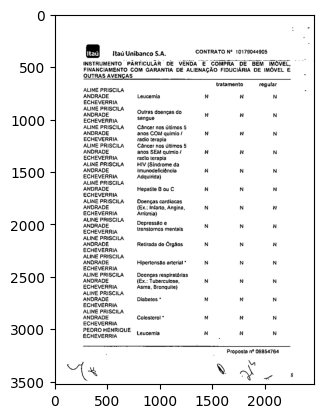

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
averbacao


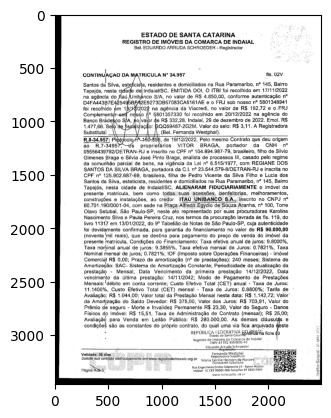

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
lig


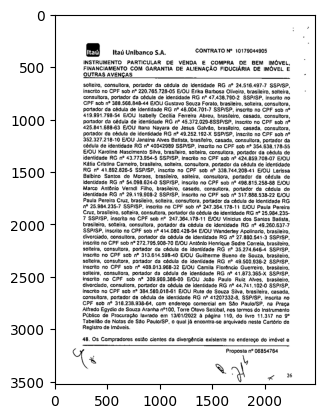

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
lig


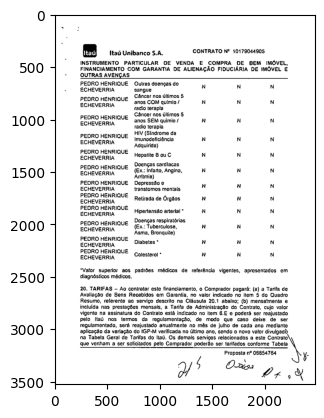

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
assinaturas


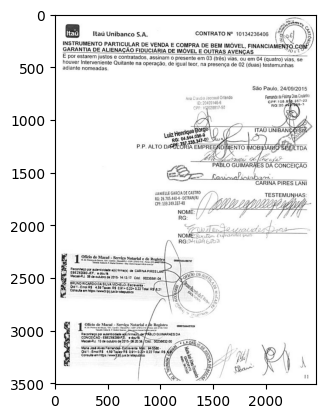

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
assinaturas


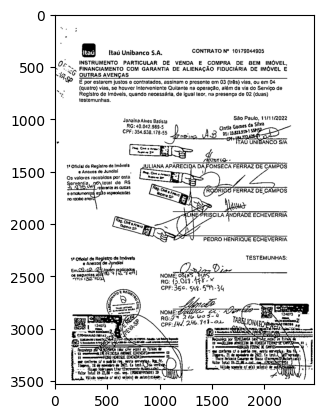

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
assinaturas


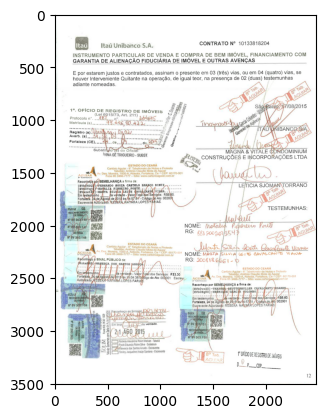

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
assinaturas


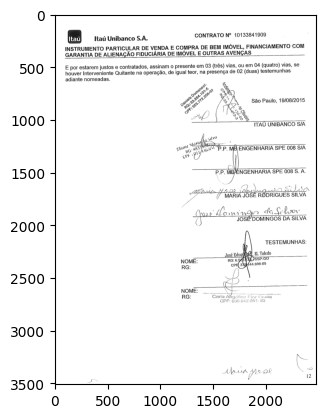

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
lig


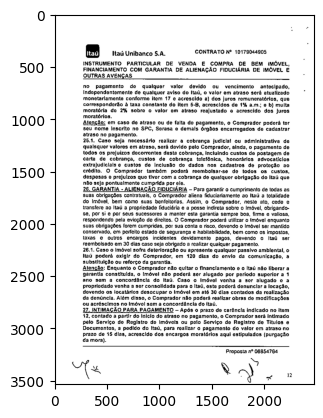

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
lig


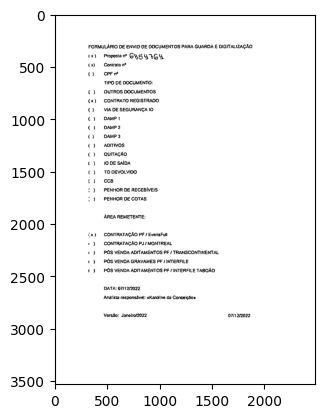

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
lig


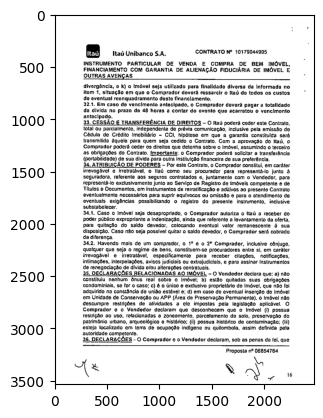

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
lig


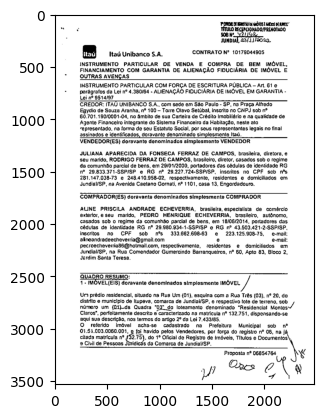

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
assinaturas


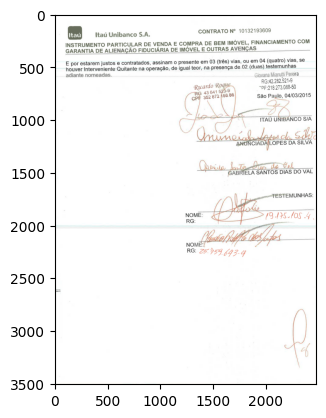

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
averbacao


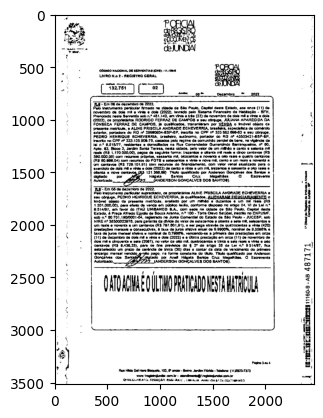

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
averbacao


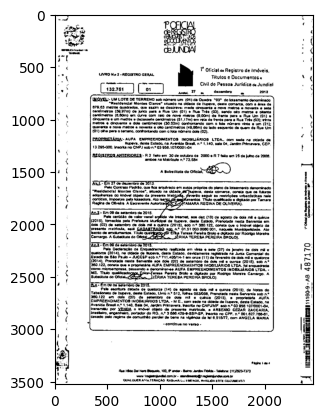

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
assinaturas


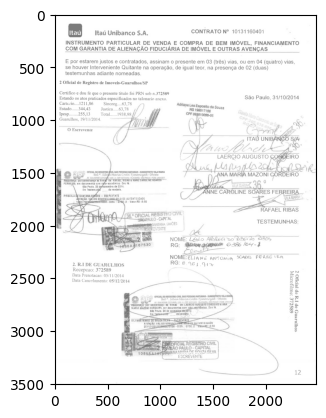

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
lig


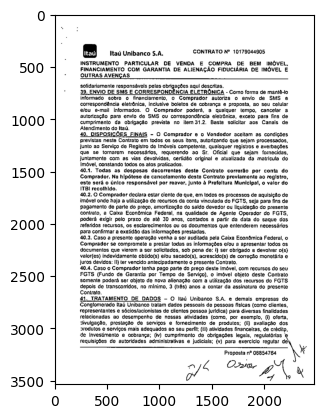

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
averbacao


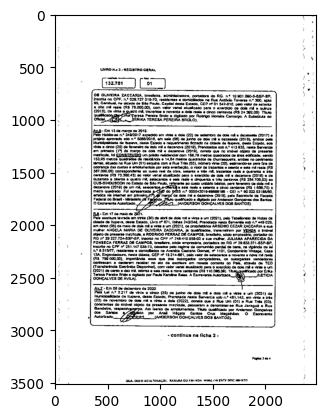

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
lig


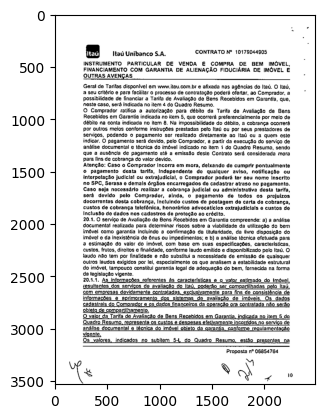

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
lig


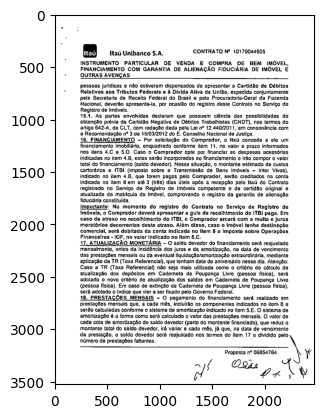

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
averbacao


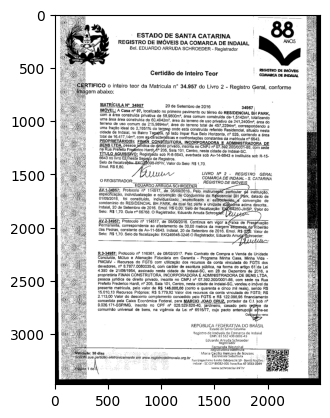

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
lig


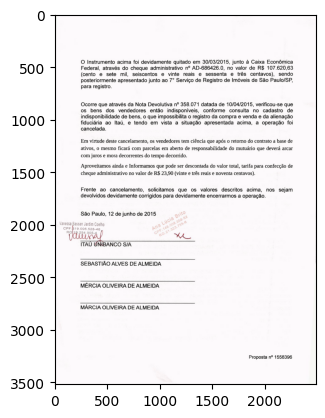

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
lig


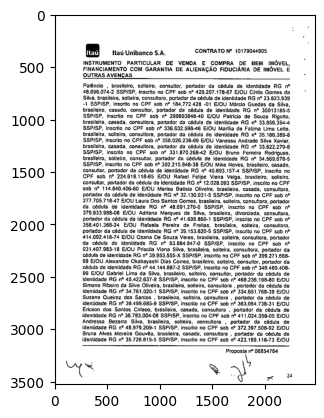

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
lig


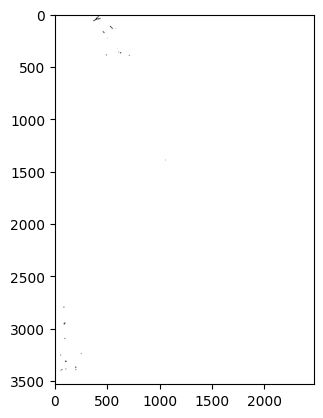

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
lig


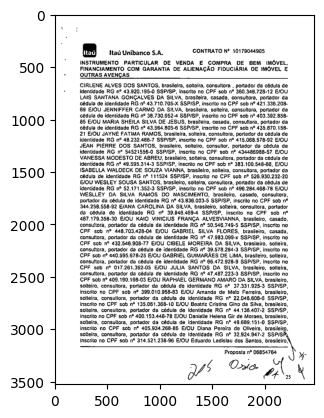

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
assinaturas


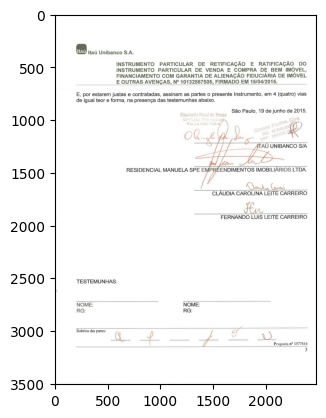

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
lig


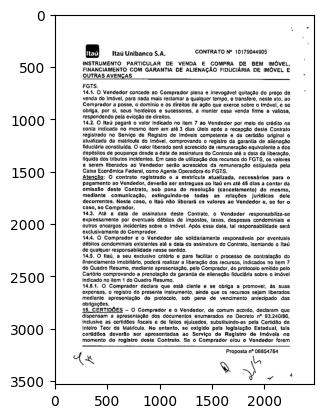

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
assinaturas


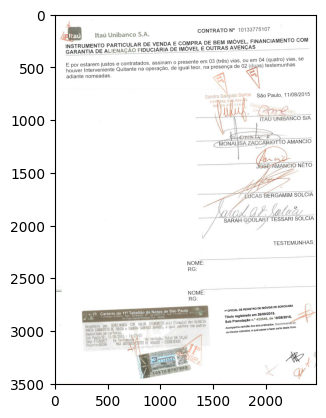

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
lig


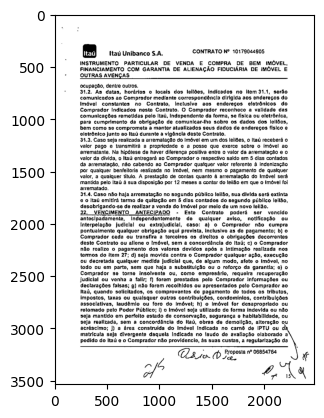

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
lig


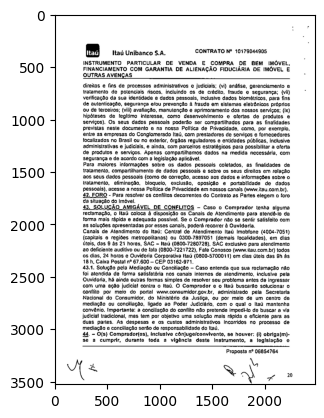

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
lig


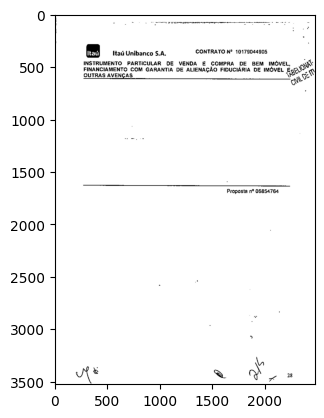

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
lig


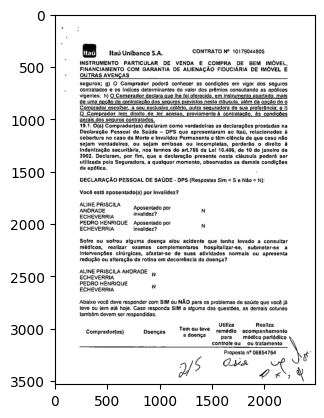

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
assinaturas


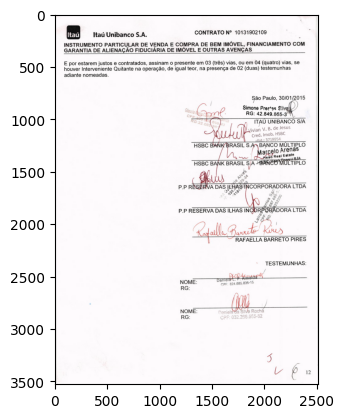

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
assinaturas


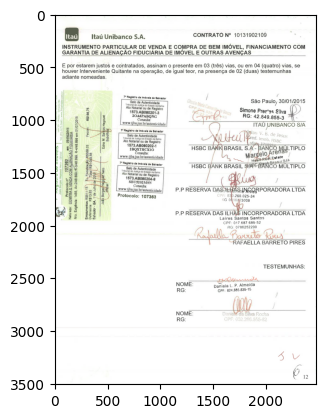

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
lig


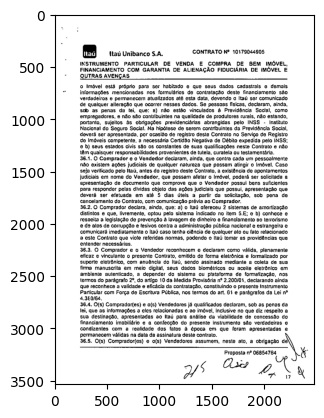

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
assinaturas


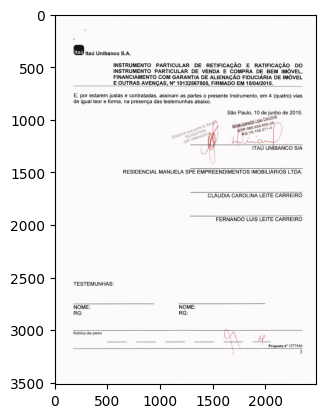

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
averbacao


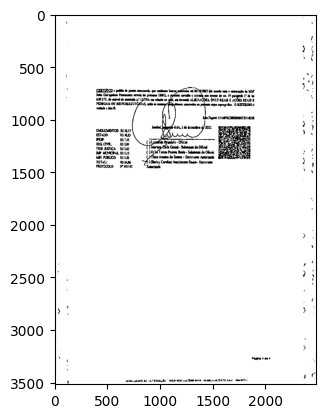

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
lig


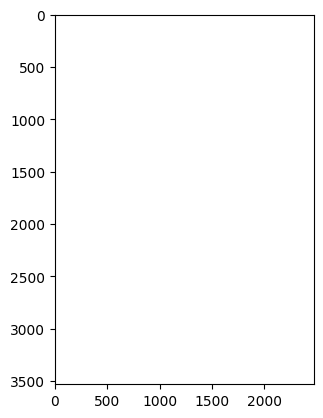

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
lig


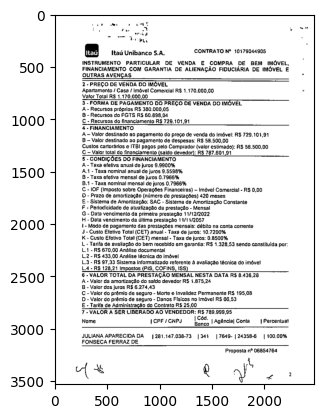

In [ ]:
for imag in images:
    img = cv2.imread(os.path.join(data_dir, 'teste', imag))
    resized =  tf.image.resize(img, [256, 256])
    y_pred = model.predict(np.expand_dims(resized/255,0))
    print(data.class_names[y_pred.argmax()])
    plt.imshow(img)
    plt.show()

In [4]:
import tensorflow as tf
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

model = tf.keras.models.load_model('models/model_full_data_v7.h5')

In [ ]:
# import tensorflow as tf

# model = tf.keras.models.load_model('models/modelo.h5')

In [ ]:
import shutil
import numpy as np  
import os
import cv2

In [ ]:
data_dir = 'output'
carpeta_clasificaciones = {
    "lig": "data_Bradesco/lig",
    "assinaturas": "data_Bradesco/assinaturas",
    "averbacao": "data_Bradesco/averbacao"
}

i = 0
for image_class in os.listdir(data_dir):
    print(f'faltan: {len(os.listdir(data_dir)) - i} carpetas')
    j = 0
    for image in os.listdir(os.path.join(data_dir, image_class)):
        print(f'faltan {len(os.listdir(os.path.join(data_dir, image_class))) - j} archivos de la carpeta {i}')
        image_path = os.path.join(data_dir, image_class, image)
        img = cv2.imread(image_path)
        resized =  tf.image.resize(img, [256, 256])
        y_pred = model.predict(np.expand_dims(resized/255,0))
        clase_predicha = data.class_names[y_pred.argmax()]
        if clase_predicha in carpeta_clasificaciones:
            carpeta_destino = carpeta_clasificaciones[clase_predicha]
            shutil.move(image_path, carpeta_destino)
            print(f"Imagen {image} movida a {clase_predicha}")
            
        else:
            print(f"Clasificación desconocida para la imagen {image}")
        j += 1
    i += 1  

faltan: 35 carpetas


NotADirectoryError: [Errno 20] Not a directory: 'output/page_5.png'

In [ ]:
from pdf2image import convert_from_path

# Ruta al archivo PDF
pdf_path = "lote_teste/10183180703/10183180703.pdf"

# Carpeta de salida para las imágenes PNG
output_folder = "output"
def pdf_to_images(pdf_path, output_folder):
    # Convierte el PDF a una lista de imágenes
    pages = convert_from_path(pdf_path)
    
    # Itera sobre cada página convertida
    for idx, page in enumerate(pages):
        # Guarda la imagen como PNG
        page.save(f"{output_folder}/page_{idx + 1}.png", "PNG")
        
pdf_to_images(pdf_path, output_folder)

In [ ]:
# images = os.listdir(os.path.join('data','assinaturas'))
# y = len(images)
# print(y)
# # import PIL


# j = 0
# i = 1000

# for image in images:
#     img = cv2.imread(os.path.join('data','assinaturas',image))
#     resized =  tf.image.resize(img, [256, 256])
#     y_pred = model.predict(np.expand_dims(resized/255,0))
#     if data.class_names[y_pred.argmax()] == 'assinaturas':continue
#     print(image, data.class_names[y_pred.argmax()], y_pred)




images_tf = []
for imagen in images:
    img = PIL.Image.open(os.path.join('data','lig',imagen))
    img_tf = tf.image.resize(np.array(img), [256, 256])/255
    images_tf.append(img_tf)
print(len(images_tf))
y_pred = model.predict(np.array(images_tf))
im_tf_page = zip(images, y_pred)
for im, y_pred in im_tf_page:
    if data.class_names[y_pred.argmax()] == 'lig':continue

    print(im, data.class_names[y_pred.argmax()])


NameError: name 'PIL' is not defined

In [ ]:
def find_signature(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    blur = cv2.GaussianBlur(img, (5, 5), 0)
    _, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    max_contour = max(contours, key=cv2.contourArea)

    x, y, w, h = cv2.boundingRect(max_contour)
    signature = img[y:y+h, x:x+w]
    return signature



In [ ]:
signature = find_signature(os.path.join(output_folder, 'page_18.png'))

In [ ]:
signature = cv2.resize(signature, (256, 256))

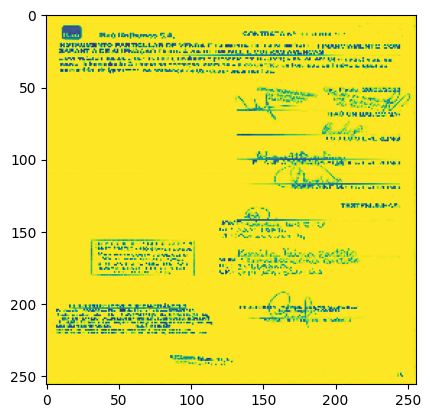

In [ ]:
plt.imshow(signature)
plt.show()

In [ ]:
def save_tiff_with_boxes(output_directory, image_path, image_with_contours):
    new_filename = "ASSINATURA_ENCONTRADA_" + os.path.basename(image_path)
    new_output_path = os.path.join(output_directory, new_filename)
    cv2.imwrite(new_output_path, image_with_contours)
    print(f"Imagem de assinatura salva {new_filename}")

In [ ]:
image_boxes = save_tiff_with_boxes('output', os.path.join(output_folder, 'page_18.png'), signature)

Imagem de assinatura salva ASSINATURA_ENCONTRADA_page_18.png


In [ ]:
import numpy as np
import cv2
import imutils
from skimage.metrics import structural_similarity as ssim
import pytesseract
# Caminhos de entrada e saída
input_path = '/content/entrada/sample_2.png'
output_path = '/content/saida/'
# Carregar a imagem de entrada
img = cv2.imread(input_path)
# Redimensionar a imagem mantendo a proporção
img_resized = imutils.resize(img, height=1000)
# Converter para escala de cinza
gray = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)
gray_blurred = cv2.GaussianBlur(gray, (5, 5), 0)
# Extrair texto usando pytesseract
extracted_text = pytesseract.image_to_string(gray)
# Verificar se a palavra "testemunhas" está presente no texto extraído
if 'testemunhas' in extracted_text.lower():
    # Calcular um limiar adaptativo para segmentar regiões claras
    adaptive_threshold = cv2.adaptiveThreshold(gray_blurred, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 11, 4)
    # Detectar bordas na imagem
    edged = cv2.Canny(adaptive_threshold, 20, 60)
    # Encontrar contornos na imagem
    contours, _ = cv2.findContours(edged.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    # Calcular a densidade de pixels não brancos em cada região delimitada pelos contornos
    densities = []
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        # Filtrar contornos com base na área mínima desejada (entre 1cm x 1cm e 5cm x 5cm)
        if 50 < w < 200 and 50 < h < 200:  # Converter de pixels para centímetros considerando a escala da imagem
            region = gray[y:y+h, x:x+w]
            non_zero_pixels = cv2.countNonZero(region)
            area = w * h
            density = non_zero_pixels / area
            densities.append((x, y, w, h, density))
    # Ordenar as regiões por densidade de pixels não brancos
    densities.sort(key=lambda x: x[4], reverse=True)
    # Selecionar as regiões mais densas para desenhar retângulos
    if densities:
        # Se foram encontradas regiões densas, desenhe retângulos nelas
        for x, y, w, h, density in densities[:5]:  # Ajuste o número de regiões a serem destacadas conforme necessário
            cv2.rectangle(img_resized, (x, y), (x + w, y + h), (255, 0, 0), 2)
        output_filename = 'detected_signature.png'
    else:
        # Se não foram encontradas regiões densas, salve como não detectado
        output_filename = 'nao_detected_signature.png'
        print("Nenhuma assinatura densa foi detectada. Imagem salva como 'nao_detected_signature.png'.")
else:
    # Se a palavra "testemunhas" não foi encontrada, salvar imediatamente como não detectado
    output_filename = 'nao_detected_signature.png'
    print("A palavra 'testemunhas' não foi encontrada. Imagem salva como 'nao_detected_signature.png'.")
# Salvar a imagem resultante na pasta de saída
cv2.imwrite(output_path + output_filename, img_resized)
# Se a imagem foi processada com sucesso, exibir os valores de SSIM
if output_filename == 'detected_signature.png':
    # Carregar imagens para comparação
    sample_image = cv2.imread(input_path)
    cropped_image = cv2.imread(output_path + output_filename)
    # Redimensionar imagens para a mesma escala (100x100)
    sample_image_gray = cv2.cvtColor(sample_image, cv2.COLOR_BGR2GRAY)
    sample_image_resized = cv2.resize(sample_image_gray, (100, 100))
    cropped_image_gray = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2GRAY)
    cropped_image_resized = cv2.resize(cropped_image_gray, (100, 100))
    # Calcular SSIM (Structural Similarity Index)
    ssim_original = ssim(sample_image_resized, sample_image_resized)
    ssim_detected = ssim(sample_image_resized, cropped_image_resized)
    # Exibir os valores de SSIM
    print("SSIM entre a imagem original e ela mesma:", ssim_original)
    print("SSIM entre a imagem original e a imagem processada:", ssim_detected)

ModuleNotFoundError: No module named 'imutils'